## MIIA-4203 MODELOS AVANZADOS PARA ANÁLISIS DE DATOS II


# Aprendizaje por transferencia con redes neuronales 


### Profesor: Camilo Franco (c.franco31@uniandes.edu.co)

En este cuadernos estudiaremos una implementación de aprendizaje por transferencia utilizando la red pre-entrenada VGG-16. Implementaremos nuestra propio modelo de aprendizaje por trasferencia utilizando la biblioteca (API) Keras (https://keras.io/). 

Finalmente evaluaremos si un modelo más complejo de *deep learning* nos permite lograr un mejor desempeño para la detección automática de frailejones sobre imagenes aereas del páramo.

                         Names                 User                Code
           - Romero Fonseca Angela Fernanda       af.romerof     201819276       
           - Juan Fernando Ortiz Serrano          jf.ortiz43     200623117
           - Elquin Huertas Ramírez               e.huertas      201920061


Primero importemos algunos de los paquetes que vamos a utilizar, junto con las imagenes de entrenamiento:


In [10]:
import numpy as np
import h5py
import matplotlib.pyplot as plt

from ImportImagenesRGB import *
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix 

%load_ext autoreload
%autoreload 2

import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

from prettytable import PrettyTable
import datetime

import keras
from keras.models import Sequential, load_model
from keras.optimizers import SGD
from keras.layers import Conv2D, MaxPooling2D, Activation, Dropout, Flatten, Dense
from keras import applications

from numpy.random import seed
seed(1)
from tensorflow import set_random_seed
set_random_seed(1)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [11]:
X,Y = import_imagenes_RGB()

print(X.shape, Y.shape, X[0,0,0])

(250, 70, 70, 3) (1, 250) [0.58823529 0.5372549  0.40392157]


**Salida esperada:**

(250, 70, 70, 3) (1, 250) [0.58823529 0.5372549  0.40392157]


## 1. Aprendizaje por transferencia

En pocas palabras, el aprendizaje por transferencia tiene su historia en la psicología, refiriendose a situaciones donde las personas aplican concimiento, estrategias y aptitudes que han aprendido previamente para enfrentar una nueva situación bajo un contexto **relacionado**. Dentro del aprendizaje computacional, este tipo de aprendizaje se enfoca en guardar un tipo de conocimiento que ya se ha mostrado útil para resolver un problema, y aplicarlo para resolver otro problema distinto pero **relacionado**.

Hay que tener en cuenta que si un modelo de transferencia tiene un efecto negativo sobre el desempeño del modelo, entonces tendremos una transferencia negativa (lo cual no es deseable). De este modo, el reto de los métodos de transferencia es el de producir una transferencia positiva entre tareas apropiadamente relacionadas, evitando transferencias negativas entre tareas poco relacionadas (ver Torrey & Shavlik (2009) Transfer learning). 

El ejemplo que vamos a ver a continuación es un tipo de aprendizaje por transferencia inductivo, característico de las redes neuronales, el cual se ajusta de acuerdo con la coincidencia de un conocimiento previo sobre la fuente de información y la tarea que se propone solucionar. En particular, vamos a llevar a cabo un *aprendizaje por transferencia inductivo-jerárquico*, buscando soluciones a tareas sencillas mediante la combinación de herramientas desarrolladas para tareas más complejas. Entonces, usamos el aprendizaje de una red pre-entrenada, la VGG-16, para aprovechar su conocimiento sobre formas, contornos, bordes, etc. que podemos hacer propias para terminar de entender mejor el problema de clasificación de frailejones, y esperamos mejorar el desempeño de los modelos.


### VGG-16

La red VGG-16 fue propuesta por Simonyan & Zisserman (2015) en Very deep CNN for large-scale image recognition, siguiendo los principios presentados en Ciresan et al. (2011): Flexible, High Performance Convolutional Neural Networks for Image Classification.

La arquitectura de la VGG-16 le permitió ganar la competición ILSVR(Imagenet) 2014 (http://www.image-net.org/challenges/LSVRC/2014/results). Los principios de esta arquitectura consisten en considerar filtros convolucionales pequeños (de $3\times 3$), que recorren las imagenes exhaustivamente, con un *stride* de 1, y capas de *max-poling* de $2\times 2$, reduciendo en gran medida el número de hiper-parámetros a optimizar. La red VGG-16 es bastante profunda, con una configuración de 16 capas (con aprox. 138 millones de parámetros): para las primeras 14 capas combina capas convolucionales y capas de agregación, y al final tiene 2 capa densamente conectadas seguidas de una capa de salida *softmax* para clasificación de múltiples clases (ver: https://neurohive.io/en/popular-networks/vgg16/).


Implementemos nuestro ejemplo de aprendizaje por transferencia utilizando la red VGG-16, la cual ha sido entrenada previamente con imagenes RGB y que podemos descargar directamente de Keras:

In [12]:
model0   = applications.VGG16(include_top=False, weights='imagenet')
config_transI = model0.get_config()


58892288/58889256 [==============================] - 514s 9us/step


Pasamos nuestro conjunto de datos por la red, obteniendo los nuevos patrones de acuerdo con el entendimiento de la red convolucional VGG-16 acerca de las nociones más básicas que encuentra en nuestras imagenes del Páramo:

In [13]:
feat_X = model0.predict(X)

Agregamos unas pocas capas finales para afinar el modelo por transferencia para la tarea específica de detección de imagenes aereas del Páramo:

In [14]:
#inicializacion Normal
initnorm = keras.initializers.RandomNormal(mean=0.0, stddev=0.05, seed=1)

model = Sequential()  
model.add(Flatten(input_shape=feat_X.shape[1:]))  
model.add(Dense(5, activation='sigmoid', kernel_initializer=initnorm, bias_initializer='zeros'))  
model.add(Dense(1, activation='sigmoid', kernel_initializer=initnorm, bias_initializer='zeros')) 

config_transF = model.get_config()

Y entrenamos esas capas finales:

In [15]:
# Inicializamos la tabla donde guardamos los resultados
x = PrettyTable(["Exac_E", "Exac_V", "Exac_P", "Epoca"])

# Definimos el número máximo de iteraciones (épocas de la red)
epocas=100

# Definimos los parametros del Adam
adam = keras.optimizers.Adam(lr=0.001, beta_1=0.9, beta_2=0.999)

# Inicializamos el error 
err_p = 999

for i in range(0,3,1):
    r = i^3
    CE_x, CV0_x, CE_y, CV0_y = train_test_split(feat_X, Y.T, test_size = 0.3, random_state = r)
    CV_x, CP_x, CV_y, CP_y = train_test_split(CV0_x, CV0_y, test_size = 0.5, random_state = r)
       
    # Definimos la arquitectura de la red
    model = Sequential.from_config(config_transF)
    
    # Definimos el método de optimización con respecto a su funcion de perdida (además guardamos la exactitud para cada iteracion)
    model.compile(loss='binary_crossentropy', optimizer=adam, metrics=['accuracy'])
    
    # Ajustamos el modelo
    history=model.fit(x=CE_x, y=CE_y, epochs=epocas, validation_data=(CV_x, CV_y), verbose=0, shuffle=False)
    
    # Encontramos el mejor modelo en validación
    min_err=np.min(history.history['val_loss'])
    best_epoc=np.where(history.history['val_loss'] == min_err)[0] 
        
    # Conseguimos el mejor modelo de acuerdo con su desempeño en validación
    model.fit(x=CE_x, y=CE_y, epochs=best_epoc[0], validation_data=(CV_x, CV_y), verbose=0, shuffle=False)
            
    # Calculamos las metricas
    train_metrics = model.evaluate(x=CE_x, y=CE_y, verbose=0)
    valid_metrics = model.evaluate(x=CV_x, y=CV_y, verbose=0)
    test_metrics = model.evaluate(x=CP_x, y=CP_y, verbose=0)
    
    # Guardamos las métricas de desempeño
    accu_e = train_metrics[1]
    loss_e = train_metrics[0]
    accu_v = valid_metrics[1]
    loss_v = valid_metrics[0]
    accu_p = test_metrics[1]
    loss_p = test_metrics[0]
    
    if (loss_p < err_p):
        pathr =('Transfer_Adam_partseed='+str(r)+'.h5')
        model.save(pathr) 
        err_p = loss_p
    
    # Imprimimos el desempeño para cada repetición
    print('Epoca= '+str(best_epoc[0])+' , accu_v1='+str(accu_v) +' , accu_v2='+str(accu_p))
    
    x.add_row([np.round(accu_e,4), np.round(accu_v,4), np.round(accu_p,4), best_epoc[0]])

print(x)


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Epoca= 99 , accu_v1=0.9729729890823364 , accu_v2=0.9210526347160339
Epoca= 99 , accu_v1=0.9729729890823364 , accu_v2=0.9210526347160339
Epoca= 99 , accu_v1=1.0 , accu_v2=0.9736841917037964
+--------+--------+--------+-------+
| Exac_E | Exac_V | Exac_P | Epoca |
+--------+--------+--------+-------+
|  1.0   | 0.973  | 0.9211 |   99  |
|  1.0   | 0.973  | 0.9211 |   99  |
|  1.0   |  1.0   | 0.9737 |   99  |
+--------+--------+--------+-------+


Graficamos el desempeño del modelo:

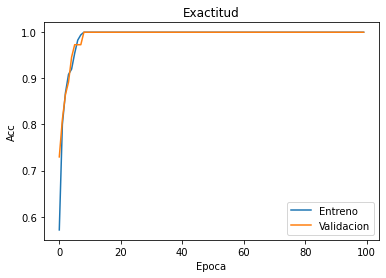

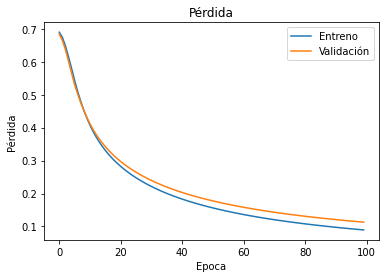

In [16]:
plt.figure(1)
plt.plot(history.history['accuracy'])  
plt.plot(history.history['val_accuracy'])  
plt.title('Exactitud')  
plt.ylabel('Acc')  
plt.xlabel('Epoca')  
plt.legend(['Entreno', 'Validacion'], loc='lower right')
plt.show()

plt.figure(1) 
plt.plot(history.history['loss'])  
plt.plot(history.history['val_loss'])  
plt.title('Pérdida')  
plt.ylabel('Pérdida')  
plt.xlabel('Epoca')  
plt.legend(['Entreno', 'Validación'], loc='upper right')  
plt.show()

Cargamos el mejor modelo y confirmamos el desempeño del modelo sobre todo el conjunto de datos:

In [17]:
# red convolucional
model_4 = load_model('Transfer_Adam_partseed=1.h5')

model_4.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_1 (Flatten)          (None, 2048)              0         
_________________________________________________________________
dense_1 (Dense)              (None, 5)                 10245     
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 6         
Total params: 10,251
Trainable params: 10,251
Non-trainable params: 0
_________________________________________________________________


Veamos el desempeño del mejor modelo sobre todo el conjunto de datos:

In [18]:
Y_pred = model_4.predict(feat_X)
Y_preds = (Y_pred > 0.5)

confusion_matrix(Y.T, Y_preds)

array([[144,   1],
       [  0, 105]], dtype=int64)

**Salida esperada:**
    
<table style="width:20%">
    <tr>
       <td> 144 </td>
       <td> 1 </td>
    </tr>
    <tr>
       <td> 0 </td>
       <td> 105 </td>
    </tr>

</table>

Podemos observar que el desempeño del modelo ha mejorado bastante. 

### Ejercicio 1.1

Encuentre el mejor modelo examinando una configuración distinta para las capas de salida, o siguiendo alguna otra estrategia como puede ser cambiando el optimizador o las funciones de activación.

- Capas profundas para la segunda fase del entrenamiento de la red (Inicialización Random Uniform, Optimizador Adam)

In [19]:
# Guardamos la arquitectura de red
initnorm = keras.initializers.RandomNormal(mean=0.0, stddev=0.05, seed=1)
model = Sequential()   
model.add(Flatten(input_shape=feat_X.shape[1:]))
model.add(Dense(700, activation='relu', kernel_initializer=initnorm, bias_initializer='zeros')) 
model.add(Dense(400, activation='relu', kernel_initializer=initnorm, bias_initializer='zeros'))
model.add(Dense(100, activation='relu', kernel_initializer=initnorm, bias_initializer='zeros'))
model.add(Dense(50, activation='relu', kernel_initializer=initnorm, bias_initializer='zeros'))
model.add(Dense(15, kernel_regularizer=keras.regularizers.l1_l2(l1=0.01, l2=0.01), activation='relu', kernel_initializer=initnorm, bias_initializer='zeros'))
model.add(Dense(1, activation='sigmoid', kernel_initializer=initnorm, bias_initializer='zeros')) 
    
# Guardamos la arquitectura de red
config_transF = model.get_config()

In [20]:
# Inicializamos la tabla donde guardamos los resultados
x = PrettyTable(["Exac_E", "Exac_V", "Exac_P", "Epoca"])

# Definimos el número máximo de iteraciones (épocas de la red)
epocas=100

# Definimos los parametros del Adam
adam = keras.optimizers.Adam(lr=0.001, beta_1=0.9, beta_2=0.999)

# Inicializamos el error 
err_p = 999

for i in range(0,3,1):
    r = i^3
    CE_x, CV0_x, CE_y, CV0_y = train_test_split(feat_X, Y.T, test_size = 0.3, random_state = r)
    CV_x, CP_x, CV_y, CP_y = train_test_split(CV0_x, CV0_y, test_size = 0.5, random_state = r)
       
    # Definimos la arquitectura de la red
    model = Sequential.from_config(config_transF)
    
    # Definimos el método de optimización con respecto a su funcion de perdida (además guardamos la exactitud para cada iteracion)
    model.compile(loss='binary_crossentropy', optimizer=adam, metrics=['accuracy'])
    
    # Ajustamos el modelo
    history=model.fit(x=CE_x, y=CE_y, epochs=epocas, validation_data=(CV_x, CV_y), verbose=0, shuffle=False)
    
    # Encontramos el mejor modelo en validación
    min_err=np.min(history.history['val_loss'])
    best_epoc=np.where(history.history['val_loss'] == min_err)[0] 
        
    # Conseguimos el mejor modelo de acuerdo con su desempeño en validación
    model.fit(x=CE_x, y=CE_y, epochs=best_epoc[0], validation_data=(CV_x, CV_y), verbose=0, shuffle=False)
            
    # Calculamos las metricas
    train_metrics = model.evaluate(x=CE_x, y=CE_y, verbose=0)
    valid_metrics = model.evaluate(x=CV_x, y=CV_y, verbose=0)
    test_metrics = model.evaluate(x=CP_x, y=CP_y, verbose=0)
    
    # Guardamos las métricas de desempeño
    accu_e = train_metrics[1]
    loss_e = train_metrics[0]
    accu_v = valid_metrics[1]
    loss_v = valid_metrics[0]
    accu_p = test_metrics[1]
    loss_p = test_metrics[0]
    
    if (loss_p < err_p):
        pathr =('Transfer_Adam_partseed='+str(r)+'.h5')
        model.save(pathr) 
        err_p = loss_p
    
    # Imprimimos el desempeño para cada repetición
    print('Epoca= '+str(best_epoc[0])+' , accu_v1='+str(accu_v) +' , accu_v2='+str(accu_p))
    
    x.add_row([np.round(accu_e,4), np.round(accu_v,4), np.round(accu_p,4), best_epoc[0]])

print(x)

Epoca= 95 , accu_v1=1.0 , accu_v2=0.9210526347160339
Epoca= 98 , accu_v1=1.0 , accu_v2=0.9210526347160339
Epoca= 98 , accu_v1=1.0 , accu_v2=0.9736841917037964
+--------+--------+--------+-------+
| Exac_E | Exac_V | Exac_P | Epoca |
+--------+--------+--------+-------+
|  1.0   |  1.0   | 0.9211 |   95  |
|  1.0   |  1.0   | 0.9211 |   98  |
|  1.0   |  1.0   | 0.9737 |   98  |
+--------+--------+--------+-------+


Graficamos el desempeño del modelo:

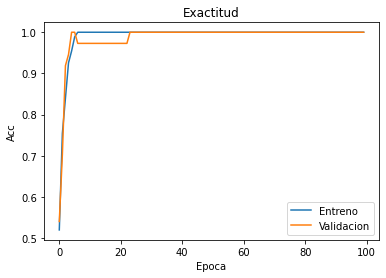

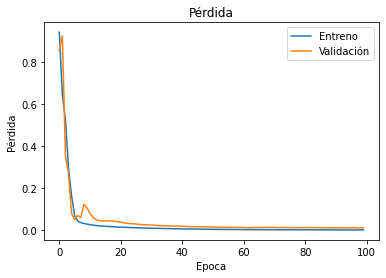

In [21]:
plt.figure(1)
plt.plot(history.history['accuracy'])  
plt.plot(history.history['val_accuracy'])  
plt.title('Exactitud')  
plt.ylabel('Acc')  
plt.xlabel('Epoca')  
plt.legend(['Entreno', 'Validacion'], loc='lower right')
plt.show()

plt.figure(1) 
plt.plot(history.history['loss'])  
plt.plot(history.history['val_loss'])  
plt.title('Pérdida')  
plt.ylabel('Pérdida')  
plt.xlabel('Epoca')  
plt.legend(['Entreno', 'Validación'], loc='upper right')  
plt.show()

- Cambiando el optimizador

In [22]:
# Guardamos la arquitectura de red
initnorm = keras.initializers.RandomNormal(mean=0.0, stddev=0.05, seed=1)
model = Sequential()   
model.add(Flatten(input_shape=feat_X.shape[1:]))
model.add(Dense(700, activation='relu', kernel_initializer=initnorm, bias_initializer='zeros')) 
model.add(Dense(400, activation='relu', kernel_initializer=initnorm, bias_initializer='zeros'))
model.add(Dense(100, activation='relu', kernel_initializer=initnorm, bias_initializer='zeros'))
model.add(Dense(50, activation='relu', kernel_initializer=initnorm, bias_initializer='zeros'))
model.add(Dense(15, kernel_regularizer=keras.regularizers.l1_l2(l1=0.01, l2=0.01), activation='relu', kernel_initializer=initnorm, bias_initializer='zeros'))
model.add(Dense(1, activation='sigmoid', kernel_initializer=initnorm, bias_initializer='zeros')) 
    
# Guardamos la arquitectura de red
config_transF = model.get_config()

In [23]:
# Inicializamos la tabla donde guardamos los resultados
x = PrettyTable(["Exac_E", "Exac_V", "Exac_P", "Epoca"])

# Definimos el número máximo de iteraciones (épocas de la red)
epocas=100

# Definimos los parametros del RMSprop
rmsprop = keras.optimizers.RMSprop(lr=0.00008, rho=0.9)

# Inicializamos el error 
err_p = 999

for i in range(0,3,1):
    r = i^3
    CE_x, CV0_x, CE_y, CV0_y = train_test_split(feat_X, Y.T, test_size = 0.3, random_state = r)
    CV_x, CP_x, CV_y, CP_y = train_test_split(CV0_x, CV0_y, test_size = 0.5, random_state = r)
       
    # Definimos la arquitectura de la red
    model = Sequential.from_config(config_transF)
    
    # Definimos el método de optimización con respecto a su funcion de perdida (además guardamos la exactitud para cada iteracion)
    model.compile(loss='binary_crossentropy', optimizer=rmsprop, metrics=['accuracy'])
    
    # Ajustamos el modelo
    history=model.fit(x=CE_x, y=CE_y, epochs=epocas, validation_data=(CV_x, CV_y), verbose=0, shuffle=False)
    
    # Encontramos el mejor modelo en validación
    min_err=np.min(history.history['val_loss'])
    best_epoc=np.where(history.history['val_loss'] == min_err)[0] 
        
    # Conseguimos el mejor modelo de acuerdo con su desempeño en validación
    model.fit(x=CE_x, y=CE_y, epochs=best_epoc[0], validation_data=(CV_x, CV_y), verbose=0, shuffle=False)
            
    # Calculamos las metricas
    train_metrics = model.evaluate(x=CE_x, y=CE_y, verbose=0)
    valid_metrics = model.evaluate(x=CV_x, y=CV_y, verbose=0)
    test_metrics = model.evaluate(x=CP_x, y=CP_y, verbose=0)
    
    # Guardamos las métricas de desempeño
    accu_e = train_metrics[1]
    loss_e = train_metrics[0]
    accu_v = valid_metrics[1]
    loss_v = valid_metrics[0]
    accu_p = test_metrics[1]
    loss_p = test_metrics[0]
    
    if (loss_p < err_p):
        pathr =('Transfer_Adam_partseed='+str(r)+'.h5')
        model.save(pathr) 
        err_p = loss_p
    
    # Imprimimos el desempeño para cada repetición
    print('Epoca= '+str(best_epoc[0])+' , accu_v1='+str(accu_v) +' , accu_v2='+str(accu_p))
    
    x.add_row([np.round(accu_e,4), np.round(accu_v,4), np.round(accu_p,4), best_epoc[0]])

print(x)

Epoca= 99 , accu_v1=0.9729729890823364 , accu_v2=0.9210526347160339
Epoca= 99 , accu_v1=0.9729729890823364 , accu_v2=0.9210526347160339
Epoca= 98 , accu_v1=1.0 , accu_v2=0.9736841917037964
+--------+--------+--------+-------+
| Exac_E | Exac_V | Exac_P | Epoca |
+--------+--------+--------+-------+
|  1.0   | 0.973  | 0.9211 |   99  |
|  1.0   | 0.973  | 0.9211 |   99  |
|  1.0   |  1.0   | 0.9737 |   98  |
+--------+--------+--------+-------+


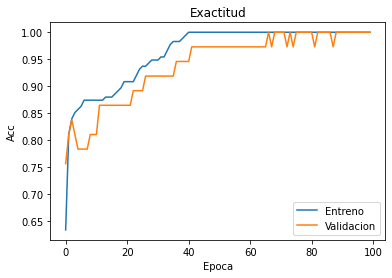

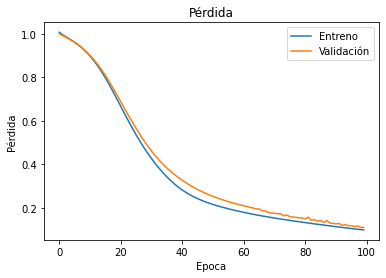

In [24]:
plt.figure(1)
plt.plot(history.history['accuracy'])  
plt.plot(history.history['val_accuracy'])  
plt.title('Exactitud')  
plt.ylabel('Acc')  
plt.xlabel('Epoca')  
plt.legend(['Entreno', 'Validacion'], loc='lower right')
plt.show()

plt.figure(1) 
plt.plot(history.history['loss'])  
plt.plot(history.history['val_loss'])  
plt.title('Pérdida')  
plt.ylabel('Pérdida')  
plt.xlabel('Epoca')  
plt.legend(['Entreno', 'Validación'], loc='upper right')  
plt.show()

- Reduciendo el número de capas y cambiando las funciones de activación

In [25]:
# Guardamos la arquitectura de red
initnorm = keras.initializers.RandomNormal(mean=0.0, stddev=0.05, seed=1)
model = Sequential()   
model.add(Flatten(input_shape=feat_X.shape[1:]))
model.add(Dense(50, activation='relu', kernel_initializer=initnorm, bias_initializer='zeros'))
model.add(Dense(15, kernel_regularizer=keras.regularizers.l1_l2(l1=0.01, l2=0.01), activation='selu', kernel_initializer=initnorm, bias_initializer='zeros'))
model.add(Dense(1, activation='sigmoid', kernel_initializer=initnorm, bias_initializer='zeros')) 
    
# Guardamos la arquitectura de red
config_transF = model.get_config()

In [26]:
# Inicializamos la tabla donde guardamos los resultados
x = PrettyTable(["Exac_E", "Exac_V", "Exac_P", "Epoca"])

# Definimos el número máximo de iteraciones (épocas de la red)
epocas=100

# Definimos los parametros del Adam
rmsprop = keras.optimizers.RMSprop(lr=0.00008, rho=0.9)

# Inicializamos el error 
err_p = 999

for i in range(0,3,1):
    r = i^3
    CE_x, CV0_x, CE_y, CV0_y = train_test_split(feat_X, Y.T, test_size = 0.3, random_state = r)
    CV_x, CP_x, CV_y, CP_y = train_test_split(CV0_x, CV0_y, test_size = 0.5, random_state = r)
       
    # Definimos la arquitectura de la red
    model = Sequential.from_config(config_transF)
    
    # Definimos el método de optimización con respecto a su funcion de perdida (además guardamos la exactitud para cada iteracion)
    model.compile(loss='binary_crossentropy', optimizer=rmsprop, metrics=['accuracy'])
    
    # Ajustamos el modelo
    history=model.fit(x=CE_x, y=CE_y, epochs=epocas, validation_data=(CV_x, CV_y), verbose=0, shuffle=False)
    
    # Encontramos el mejor modelo en validación
    min_err=np.min(history.history['val_loss'])
    best_epoc=np.where(history.history['val_loss'] == min_err)[0] 
        
    # Conseguimos el mejor modelo de acuerdo con su desempeño en validación
    model.fit(x=CE_x, y=CE_y, epochs=best_epoc[0], validation_data=(CV_x, CV_y), verbose=0, shuffle=False)
            
    # Calculamos las metricas
    train_metrics = model.evaluate(x=CE_x, y=CE_y, verbose=0)
    valid_metrics = model.evaluate(x=CV_x, y=CV_y, verbose=0)
    test_metrics = model.evaluate(x=CP_x, y=CP_y, verbose=0)
    
    # Guardamos las métricas de desempeño
    accu_e = train_metrics[1]
    loss_e = train_metrics[0]
    accu_v = valid_metrics[1]
    loss_v = valid_metrics[0]
    accu_p = test_metrics[1]
    loss_p = test_metrics[0]
    
    if (loss_p < err_p):
        pathr =('Transfer_Adam_partseed='+str(r)+'.h5')
        model.save(pathr) 
        err_p = loss_p
    
    # Imprimimos el desempeño para cada repetición
    print('Epoca= '+str(best_epoc[0])+' , accu_v1='+str(accu_v) +' , accu_v2='+str(accu_p))
    
    x.add_row([np.round(accu_e,4), np.round(accu_v,4), np.round(accu_p,4), best_epoc[0]])

print(x)

Epoca= 99 , accu_v1=0.9459459185600281 , accu_v2=0.8947368264198303
Epoca= 99 , accu_v1=0.9729729890823364 , accu_v2=0.8421052694320679
Epoca= 99 , accu_v1=0.9729729890823364 , accu_v2=0.9473684430122375
+--------+--------+--------+-------+
| Exac_E | Exac_V | Exac_P | Epoca |
+--------+--------+--------+-------+
| 0.9943 | 0.9459 | 0.8947 |   99  |
| 0.9943 | 0.973  | 0.8421 |   99  |
|  1.0   | 0.973  | 0.9474 |   99  |
+--------+--------+--------+-------+


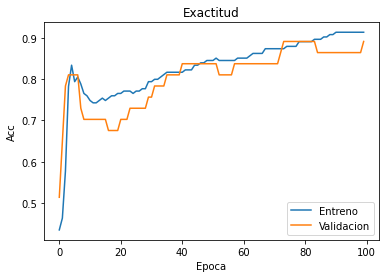

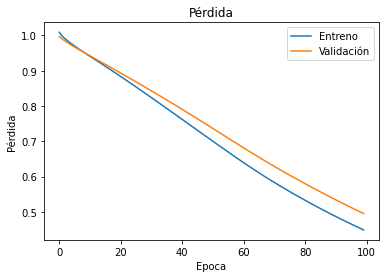

In [27]:
plt.figure(1)
plt.plot(history.history['accuracy'])  
plt.plot(history.history['val_accuracy'])  
plt.title('Exactitud')  
plt.ylabel('Acc')  
plt.xlabel('Epoca')  
plt.legend(['Entreno', 'Validacion'], loc='lower right')
plt.show()

plt.figure(1) 
plt.plot(history.history['loss'])  
plt.plot(history.history['val_loss'])  
plt.title('Pérdida')  
plt.ylabel('Pérdida')  
plt.xlabel('Epoca')  
plt.legend(['Entreno', 'Validación'], loc='upper right')  
plt.show()

- Dos capas escondidas funciones de activación= relu y selu, Dropout=0,15 y optimizador Adam

In [28]:
# Guardamos la arquitectura de red
initnorm = keras.initializers.RandomNormal(mean=0.0, stddev=0.05, seed=1)
model = Sequential()   
model.add(Flatten(input_shape=feat_X.shape[1:]))
model.add(Dense(50, activation='tanh', kernel_initializer=initnorm, bias_initializer='zeros'))
model.add(Dense(15, kernel_regularizer=keras.regularizers.l1_l2(l1=0.01, l2=0.01), activation='selu', kernel_initializer=initnorm, bias_initializer='zeros'))
model.add(Dropout(rate=0.15, seed=1))  
model.add(Dense(1, activation='sigmoid', kernel_initializer=initnorm, bias_initializer='zeros')) 
    
# Guardamos la arquitectura de red
config_transF = model.get_config()

In [29]:
# Inicializamos la tabla donde guardamos los resultados
x = PrettyTable(["Exac_E", "Exac_V", "Exac_P", "Epoca"])

# Definimos el número máximo de iteraciones (épocas de la red)
epocas=100

# Definimos los parametros del Adam
adam = keras.optimizers.Adam(lr=0.0001, beta_1=0.7, beta_2=0.99, epsilon=1e-09)

# Inicializamos el error 
err_p = 999

for i in range(0,3,1):
    r = i^3
    CE_x, CV0_x, CE_y, CV0_y = train_test_split(feat_X, Y.T, test_size = 0.3, random_state = r)
    CV_x, CP_x, CV_y, CP_y = train_test_split(CV0_x, CV0_y, test_size = 0.5, random_state = r)
       
    # Definimos la arquitectura de la red
    model = Sequential.from_config(config_transF)
    
    # Definimos el método de optimización con respecto a su funcion de perdida (además guardamos la exactitud para cada iteracion)
    model.compile(loss='binary_crossentropy', optimizer=adam, metrics=['accuracy'])
    
    # Ajustamos el modelo
    history=model.fit(x=CE_x, y=CE_y, epochs=epocas, validation_data=(CV_x, CV_y), verbose=0, shuffle=False)
    
    # Encontramos el mejor modelo en validación
    min_err=np.min(history.history['val_loss'])
    best_epoc=np.where(history.history['val_loss'] == min_err)[0] 
        
    # Conseguimos el mejor modelo de acuerdo con su desempeño en validación
    model.fit(x=CE_x, y=CE_y, epochs=best_epoc[0], validation_data=(CV_x, CV_y), verbose=0, shuffle=False)
            
    # Calculamos las metricas
    train_metrics = model.evaluate(x=CE_x, y=CE_y, verbose=0)
    valid_metrics = model.evaluate(x=CV_x, y=CV_y, verbose=0)
    test_metrics = model.evaluate(x=CP_x, y=CP_y, verbose=0)
    
    # Guardamos las métricas de desempeño
    accu_e = train_metrics[1]
    loss_e = train_metrics[0]
    accu_v = valid_metrics[1]
    loss_v = valid_metrics[0]
    accu_p = test_metrics[1]
    loss_p = test_metrics[0]
    
    if (loss_p < err_p):
        pathr =('Transfer_Adam_partseed='+str(r)+'.h5')
        model.save(pathr) 
        err_p = loss_p
    
    # Imprimimos el desempeño para cada repetición
    print('Epoca= '+str(best_epoc[0])+' , accu_v1='+str(accu_v) +' , accu_v2='+str(accu_p))
    
    x.add_row([np.round(accu_e,4), np.round(accu_v,4), np.round(accu_p,4), best_epoc[0]])

print(x)

Epoca= 99 , accu_v1=0.9729729890823364 , accu_v2=0.9210526347160339
Epoca= 99 , accu_v1=0.9729729890823364 , accu_v2=0.8947368264198303
Epoca= 99 , accu_v1=0.9729729890823364 , accu_v2=0.9736841917037964
+--------+--------+--------+-------+
| Exac_E | Exac_V | Exac_P | Epoca |
+--------+--------+--------+-------+
|  1.0   | 0.973  | 0.9211 |   99  |
|  1.0   | 0.973  | 0.8947 |   99  |
|  1.0   | 0.973  | 0.9737 |   99  |
+--------+--------+--------+-------+


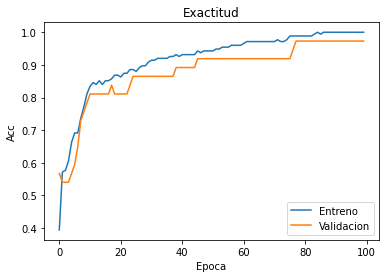

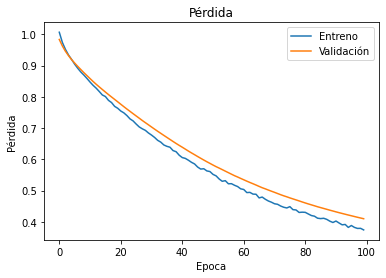

In [30]:
plt.figure(1)
plt.plot(history.history['accuracy'])  
plt.plot(history.history['val_accuracy'])  
plt.title('Exactitud')  
plt.ylabel('Acc')  
plt.xlabel('Epoca')  
plt.legend(['Entreno', 'Validacion'], loc='lower right')
plt.show()

plt.figure(1) 
plt.plot(history.history['loss'])  
plt.plot(history.history['val_loss'])  
plt.title('Pérdida')  
plt.ylabel('Pérdida')  
plt.xlabel('Epoca')  
plt.legend(['Entreno', 'Validación'], loc='upper right')  
plt.show()

- Una capa escondida y optimizador RMSprop

In [31]:
#inicializacion Normal
initnorm = keras.initializers.RandomNormal(mean=0.0, stddev=0.05, seed=1)

model = Sequential()  
model.add(Flatten(input_shape=feat_X.shape[1:]))  
model.add(Dense(5, activation='sigmoid', kernel_initializer=initnorm, bias_initializer='zeros'))  
model.add(Dense(1, activation='sigmoid', kernel_initializer=initnorm, bias_initializer='zeros')) 

config_transF = model.get_config()

In [32]:
# Inicializamos la tabla donde guardamos los resultados
x = PrettyTable(["Exac_E", "Exac_V", "Exac_P", "Epoca"])

# Definimos el número máximo de iteraciones (épocas de la red)
epocas=100

# Definimos los parametros del Adam
rmsprop = keras.optimizers.RMSprop(lr=0.00008, rho=0.9)

# Inicializamos el error 
err_p = 999

for i in range(0,3,1):
    r = i^3
    CE_x, CV0_x, CE_y, CV0_y = train_test_split(feat_X, Y.T, test_size = 0.3, random_state = r)
    CV_x, CP_x, CV_y, CP_y = train_test_split(CV0_x, CV0_y, test_size = 0.5, random_state = r)
       
    # Definimos la arquitectura de la red
    model = Sequential.from_config(config_transF)
    
    # Definimos el método de optimización con respecto a su funcion de perdida (además guardamos la exactitud para cada iteracion)
    model.compile(loss='binary_crossentropy', optimizer=rmsprop, metrics=['accuracy'])
    
    # Ajustamos el modelo
    history=model.fit(x=CE_x, y=CE_y, epochs=epocas, validation_data=(CV_x, CV_y), verbose=0, shuffle=False)
    
    # Encontramos el mejor modelo en validación
    min_err=np.min(history.history['val_loss'])
    best_epoc=np.where(history.history['val_loss'] == min_err)[0] 
        
    # Conseguimos el mejor modelo de acuerdo con su desempeño en validación
    model.fit(x=CE_x, y=CE_y, epochs=best_epoc[0], validation_data=(CV_x, CV_y), verbose=0, shuffle=False)
            
    # Calculamos las metricas
    train_metrics = model.evaluate(x=CE_x, y=CE_y, verbose=0)
    valid_metrics = model.evaluate(x=CV_x, y=CV_y, verbose=0)
    test_metrics = model.evaluate(x=CP_x, y=CP_y, verbose=0)
    
    # Guardamos las métricas de desempeño
    accu_e = train_metrics[1]
    loss_e = train_metrics[0]
    accu_v = valid_metrics[1]
    loss_v = valid_metrics[0]
    accu_p = test_metrics[1]
    loss_p = test_metrics[0]
    
    if (loss_p < err_p):
        pathr =('Transfer_Adam_partseed='+str(r)+'.h5')
        model.save(pathr) 
        err_p = loss_p
    
    # Imprimimos el desempeño para cada repetición
    print('Epoca= '+str(best_epoc[0])+' , accu_v1='+str(accu_v) +' , accu_v2='+str(accu_p))
    
    x.add_row([np.round(accu_e,4), np.round(accu_v,4), np.round(accu_p,4), best_epoc[0]])

print(x)

Epoca= 99 , accu_v1=0.8918918967247009 , accu_v2=0.8947368264198303
Epoca= 99 , accu_v1=0.9459459185600281 , accu_v2=0.7894737124443054
Epoca= 99 , accu_v1=0.8648648858070374 , accu_v2=0.8684210777282715
+--------+--------+--------+-------+
| Exac_E | Exac_V | Exac_P | Epoca |
+--------+--------+--------+-------+
| 0.9486 | 0.8919 | 0.8947 |   99  |
| 0.9486 | 0.9459 | 0.7895 |   99  |
| 0.9257 | 0.8649 | 0.8684 |   99  |
+--------+--------+--------+-------+


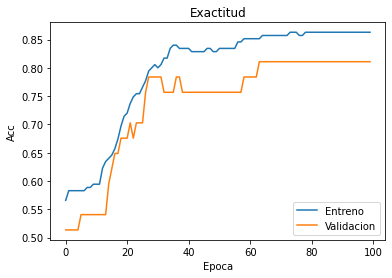

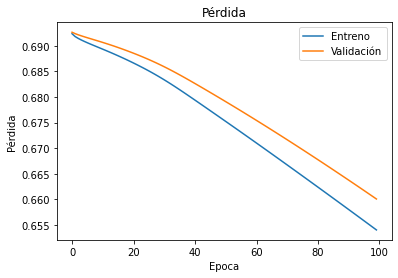

In [33]:
plt.figure(1)
plt.plot(history.history['accuracy'])  
plt.plot(history.history['val_accuracy'])  
plt.title('Exactitud')  
plt.ylabel('Acc')  
plt.xlabel('Epoca')  
plt.legend(['Entreno', 'Validacion'], loc='lower right')
plt.show()

plt.figure(1) 
plt.plot(history.history['loss'])  
plt.plot(history.history['val_loss'])  
plt.title('Pérdida')  
plt.ylabel('Pérdida')  
plt.xlabel('Epoca')  
plt.legend(['Entreno', 'Validación'], loc='upper right')  
plt.show()

- Una capa escondida activación=Relu y optimizador Adam

In [34]:
#inicializacion Normal
initnorm = keras.initializers.RandomNormal(mean=0.0, stddev=0.05, seed=1)

model = Sequential()  
model.add(Flatten(input_shape=feat_X.shape[1:]))  
model.add(Dense(4, activation='sigmoid', kernel_initializer=initnorm, bias_initializer='zeros'))  
model.add(Dense(1, activation='sigmoid', kernel_initializer=initnorm, bias_initializer='zeros')) 

config_transF = model.get_config()

In [35]:
# Inicializamos la tabla donde guardamos los resultados
x = PrettyTable(["Exac_E", "Exac_V", "Exac_P", "Epoca"])

# Definimos el número máximo de iteraciones (épocas de la red)
epocas=100

# Definimos los parametros del Adam
adam = keras.optimizers.Adam(lr=0.0001, beta_1=0.7, beta_2=0.99, epsilon=1e-09)

# Inicializamos el error 
err_p = 999

for i in range(0,3,1):
    r = i^3
    CE_x, CV0_x, CE_y, CV0_y = train_test_split(feat_X, Y.T, test_size = 0.3, random_state = r)
    CV_x, CP_x, CV_y, CP_y = train_test_split(CV0_x, CV0_y, test_size = 0.5, random_state = r)
       
    # Definimos la arquitectura de la red
    model = Sequential.from_config(config_transF)
    
    # Definimos el método de optimización con respecto a su funcion de perdida (además guardamos la exactitud para cada iteracion)
    model.compile(loss='binary_crossentropy', optimizer=rmsprop, metrics=['accuracy'])
    
    # Ajustamos el modelo
    history=model.fit(x=CE_x, y=CE_y, epochs=epocas, validation_data=(CV_x, CV_y), verbose=0, shuffle=False)
    
    # Encontramos el mejor modelo en validación
    min_err=np.min(history.history['val_loss'])
    best_epoc=np.where(history.history['val_loss'] == min_err)[0] 
        
    # Conseguimos el mejor modelo de acuerdo con su desempeño en validación
    model.fit(x=CE_x, y=CE_y, epochs=best_epoc[0], validation_data=(CV_x, CV_y), verbose=0, shuffle=False)
            
    # Calculamos las metricas
    train_metrics = model.evaluate(x=CE_x, y=CE_y, verbose=0)
    valid_metrics = model.evaluate(x=CV_x, y=CV_y, verbose=0)
    test_metrics = model.evaluate(x=CP_x, y=CP_y, verbose=0)
    
    # Guardamos las métricas de desempeño
    accu_e = train_metrics[1]
    loss_e = train_metrics[0]
    accu_v = valid_metrics[1]
    loss_v = valid_metrics[0]
    accu_p = test_metrics[1]
    loss_p = test_metrics[0]
    
    if (loss_p < err_p):
        pathr =('Transfer_Adam_partseed='+str(r)+'.h5')
        model.save(pathr) 
        err_p = loss_p
    
    # Imprimimos el desempeño para cada repetición
    print('Epoca= '+str(best_epoc[0])+' , accu_v1='+str(accu_v) +' , accu_v2='+str(accu_p))
    
    x.add_row([np.round(accu_e,4), np.round(accu_v,4), np.round(accu_p,4), best_epoc[0]])

print(x)

Epoca= 99 , accu_v1=0.8648648858070374 , accu_v2=0.8947368264198303
Epoca= 99 , accu_v1=0.9189189076423645 , accu_v2=0.8157894611358643
Epoca= 99 , accu_v1=0.8648648858070374 , accu_v2=0.8684210777282715
+--------+--------+--------+-------+
| Exac_E | Exac_V | Exac_P | Epoca |
+--------+--------+--------+-------+
| 0.9371 | 0.8649 | 0.8947 |   99  |
| 0.9543 | 0.9189 | 0.8158 |   99  |
|  0.92  | 0.8649 | 0.8684 |   99  |
+--------+--------+--------+-------+


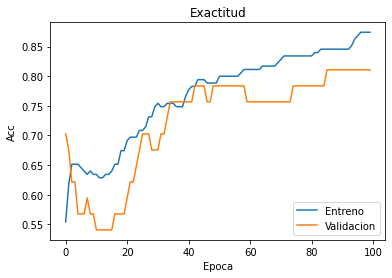

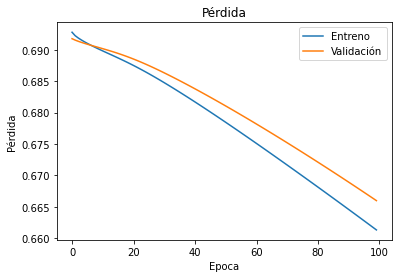

In [36]:
plt.figure(1)
plt.plot(history.history['accuracy'])  
plt.plot(history.history['val_accuracy'])  
plt.title('Exactitud')  
plt.ylabel('Acc')  
plt.xlabel('Epoca')  
plt.legend(['Entreno', 'Validacion'], loc='lower right')
plt.show()

plt.figure(1) 
plt.plot(history.history['loss'])  
plt.plot(history.history['val_loss'])  
plt.title('Pérdida')  
plt.ylabel('Pérdida')  
plt.xlabel('Epoca')  
plt.legend(['Entreno', 'Validación'], loc='upper right')  
plt.show()

- Se probó el aumento de capas en la fase final y se identificó que entre más capas se incluyan, el modelo tiende a generar inestabilidad en la convergencia tanto en la medida de desempeño como en la función de pérdida.
- Las funciones: tangente hiperbólica, relu y selu fueron analizadas y no presentaron mayor aporte al aprendizaje del modelo.
- Con una capa escondida en la fase final el modelo es más estable en su convergencia, usando la función de activación sigmoide y optimizador Adam, toda vez que se analizaron otras funciones de activación y el optimizador RMSprop obteniendo iguales o incluso menores resultados en la medida de desempeño.
- Finalmente, incluir más neuronas en la capa escondida mejoró la medida de desempeño del modelo.


## 2. Caso aplicado

Ahora probemos nuestro modelo sobre la imagen completa de prueba del paramo ``IMG_3451.JPG``.


In [ ]:
from keras.preprocessing.image import image

img = image.load_img('images/IMG_3451.JPG')
img 

### 2.1 Red sencilla

In [41]:
# red sencilla 5 neuronas
model_1 = load_model('modelo_redsencilla_initseed=1_part_seed=3numn=5.h5')

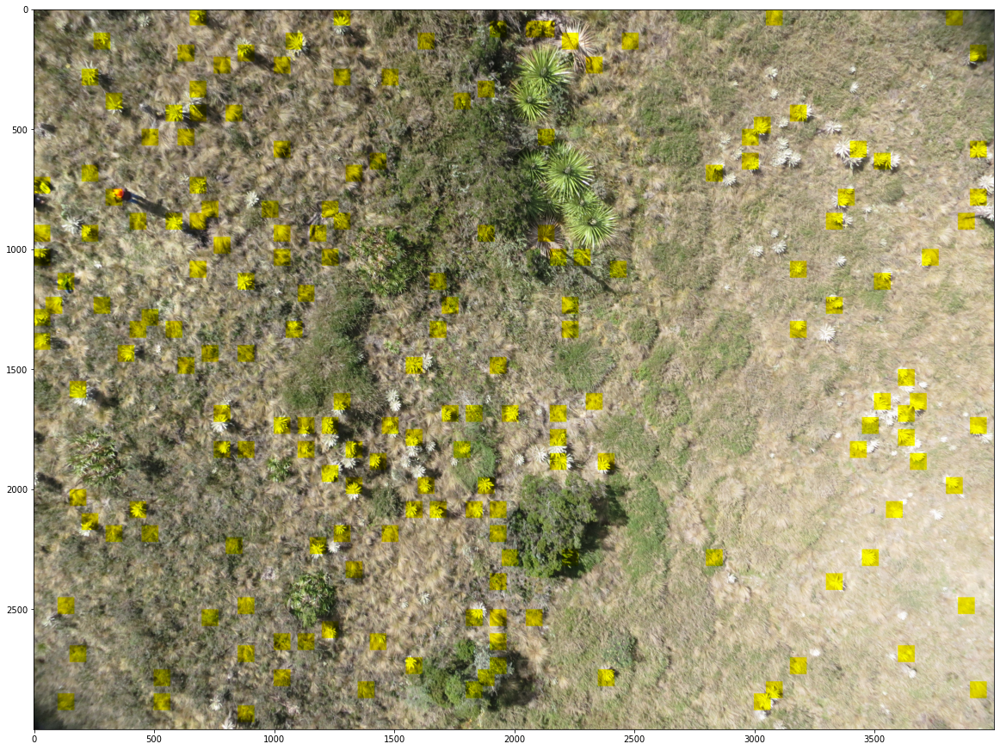

In [42]:
# Lo pasamos por nuestra imagen de prueba
x = np.array(img)
x2 = x

ni = x.shape[0]-50
mi = x.shape[1]-50

f1=0
f2=70
for i in range(1,ni,50):
    c1=0
    c2=70
    for j in range(1,mi,50):
        subi=x[f1:f2,c1:c2,]/255.
        subi2=np.expand_dims(subi,0)
        Y_preds = model_1.predict(subi2)
        pred_P = (Y_preds > 0.5)
        if(pred_P==1):
            x2[f1:f2,c1:c2,2]=0
        c1=c1+50
        c2=c2+50
    f1=f1+50
    f2=f2+50
        
plt.figure(figsize = (20,20))
plt.imshow(x2)

### 2.2 Red multi-capa

In [43]:
# red profunda de 6 capas
model_2 = load_model('modelo_redprofunda_initseed=1_part_seed=8_Init=Normal.h5')

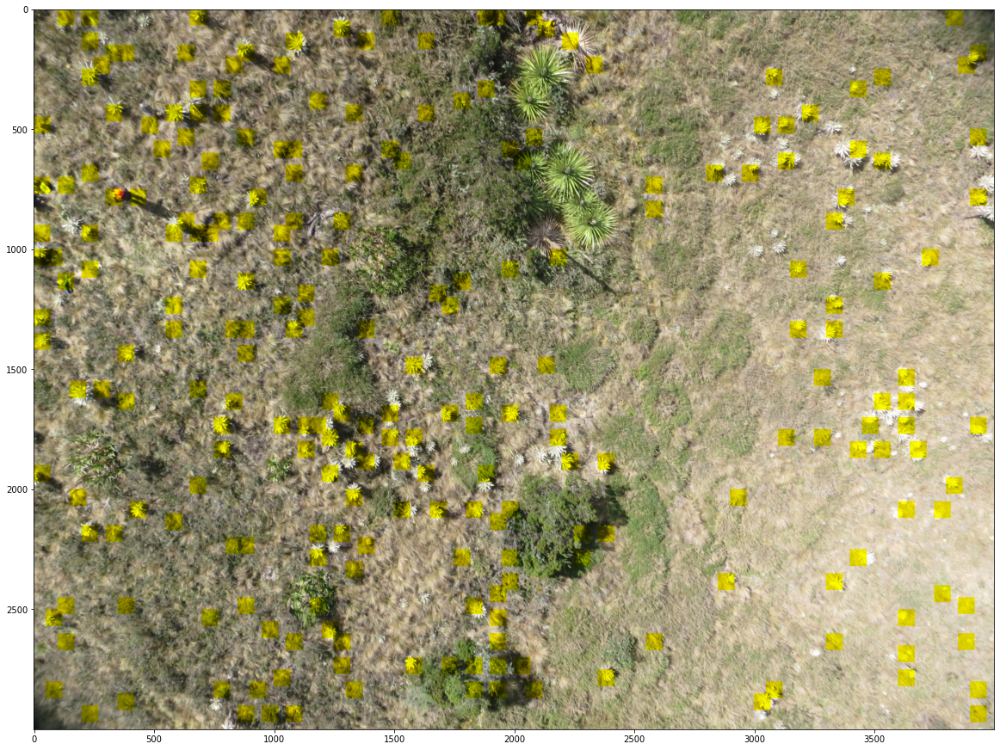

In [44]:
# Lo pasamos por nuestra imagen de prueba
x = np.array(img)
x2 = x

ni = x.shape[0]-50
mi = x.shape[1]-50

f1=0
f2=70
for i in range(1,ni,50):
    c1=0
    c2=70
    for j in range(1,mi,50):
        subi=x[f1:f2,c1:c2,]/255.
        subi2=np.expand_dims(subi,0)
        Y_preds = model_2.predict(subi2)
        pred_P = (Y_preds > 0.5)
        if(pred_P==1):
            x2[f1:f2,c1:c2,2]=0
        c1=c1+50
        c2=c2+50
    f1=f1+50
    f2=f2+50
        
plt.figure(figsize = (20,20))
plt.imshow(x2)

### 2.3 Red Convolucional

In [45]:
# red convolucional sencilla
model_3 = load_model('modelo_CNN_initseed=1_part_seed=3.h5')

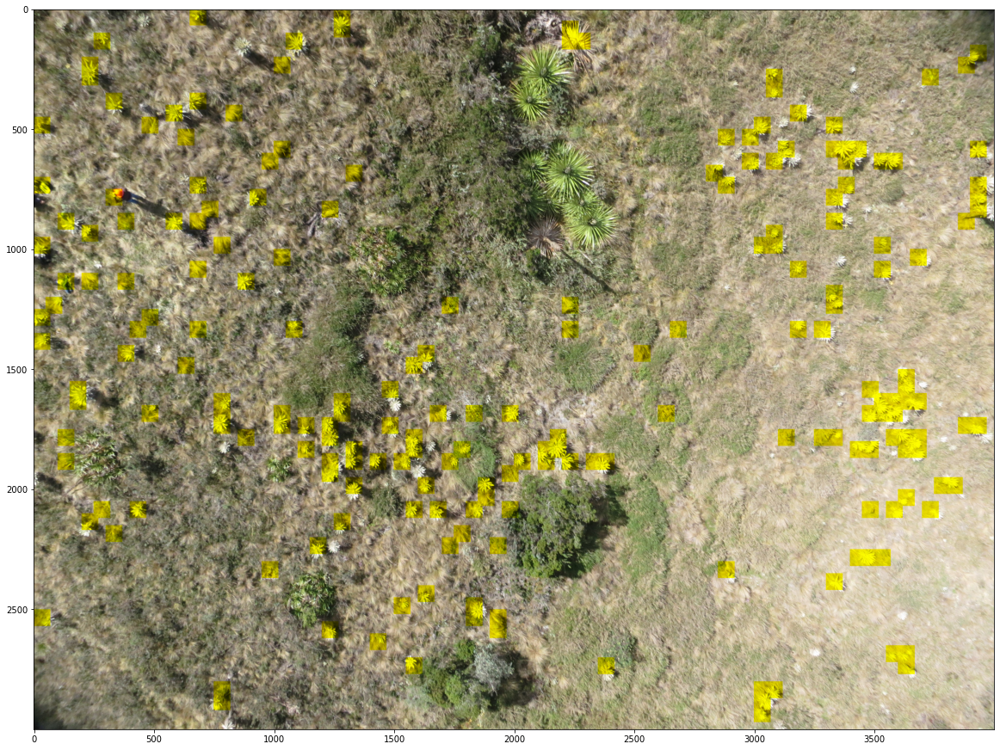

In [46]:
# Lo pasamos por nuestra imagen de prueba
x = np.array(img)
x2 = x

ni = x.shape[0]-50
mi = x.shape[1]-50

f1=0
f2=70
for i in range(1,ni,50):
    c1=0
    c2=70
    for j in range(1,mi,50):
        subi=x[f1:f2,c1:c2,]/255.
        subi2=np.expand_dims(subi,0)
        Y_preds = model_3.predict(subi2)
        pred_P = (Y_preds > 0.5)
        if(pred_P==1):
            x2[f1:f2,c1:c2,2]=0
        c1=c1+50
        c2=c2+50
    f1=f1+50
    f2=f2+50
        
plt.figure(figsize = (20,20))
plt.imshow(x2)

### 2.4 Red Convolucional VGG-16 con transferencia

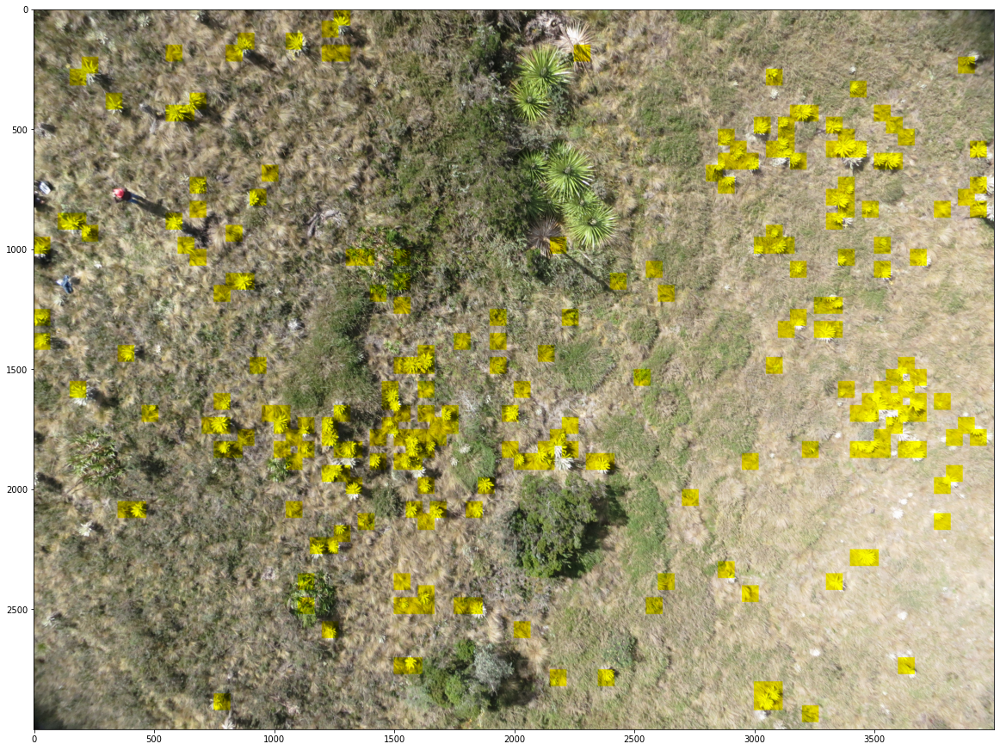

In [47]:
# Lo pasamos por nuestra imagen de prueba
x = np.array(img)
x2 = x

ni = x.shape[0]-50
mi = x.shape[1]-50

f1=0
f2=70
for i in range(1,ni,50):
    c1=0
    c2=70
    for j in range(1,mi,50):
        subi=x[f1:f2,c1:c2,]/255.
        subi2=np.expand_dims(subi,0)
        feat_subi2 = model0.predict(subi2)
        Y_preds = model_4.predict(feat_subi2)
        pred_P = (Y_preds > 0.5)
        if(pred_P==1):
            x2[f1:f2,c1:c2,2]=0
        c1=c1+50
        c2=c2+50
    f1=f1+50
    f2=f2+50
        
plt.figure(figsize = (20,20))
plt.imshow(x2)

### Pregunta 2.1

¿Qué puede observar sobre el desempeño de los diferentes modelos? Argumente cuál es el mejor modelo para poner en producción.

 - El modelo de red sencilla se equivoca principalmente en zonas de baja densidad de frailejones; mientras que el de red multicapa lo supera en este aspecto ya que empieza a generar mejor predicción en las zonas de baja densidad; no obstante, los dos tipos de modelos fallan en pzonas de alta densidad de otras especies.
 - El modelo de redes convolucionales obtiene mejor desempeño versus el de red multicapa ya que evita predicir falsos positivos, los cuales eran notoriamente más visibles en la red multicapa. En otras palabras, las redes convolucionales no predicen frailejones en zonas de otras especies.
 - La red entrenada por transferencia obtiene mejor desempeño que las anteriores identificando acertadamente frailejones en zonas de baja densidad de esta especie. Aunque su nivel de equivocación es bajo, predice frailejones en zonas donde hay presencia de especies muy similares a éstos.
 - La red entrenada fue la única de todas que no clasificó la persona de la fotografía como frailejón, esto indica que el preentrenamiento de las formas y figuras de la VGG-16 muestra un aporte importante para el reconocimiento de ciertas formas específicas.

### Ejercicio 2.2

Investigue otra red pre-entrenada dsitinta a la VGG-16 e implemente el aprendizaje por transferencia para la deteccion de frailejones. Argumente por qué su justifica el aprendizaje por transferencia con base en el modelo pre-entrenado de su elección (cómo se relacionan la tarea base y la segunda tarea objetivo).

### VGG19: Es una red pre-entrenada de 19 capas profundas y es entrenada con más de un millon de imagenes de imagenet, clasifica imágenes para más de 1000 objetos. 

- https://keras.io/api/applications/vgg/
- https://iq.opengenus.org/vgg19-architecture/

In [48]:
model0   = applications.VGG19(include_top=False, weights='imagenet')
config_transI = model0.get_config()

80142336/80134624 [==============================] - 5904s 74us/step


In [49]:
feat_X = model0.predict(X)

Agregamos unas pocas capas finales para afinar el modelo por transferencia para la tarea específica de detección de imagenes aereas del Páramo:

In [50]:
#inicializacion Normal
initnorm = keras.initializers.RandomNormal(mean=0.0, stddev=0.05, seed=1)

model = Sequential()  
model.add(Flatten(input_shape=feat_X.shape[1:]))  
model.add(Dense(5, activation='sigmoid', kernel_initializer=initnorm, bias_initializer='zeros'))  
model.add(Dense(1, activation='sigmoid', kernel_initializer=initnorm, bias_initializer='zeros')) 

config_transF = model.get_config()

Y entrenamos esas capas finales:

In [54]:
# Inicializamos la tabla donde guardamos los resultados
x = PrettyTable(["Exac_E", "Exac_V", "Exac_P", "Epoca"])

# Definimos el número máximo de iteraciones (épocas de la red)
epocas=100

# Definimos los parametros del Adam
adam = keras.optimizers.Adam(lr=0.001, beta_1=0.9, beta_2=0.999)

# Inicializamos el error 
err_p = 999

for i in range(0,3,1):
    r = i^3
    CE_x, CV0_x, CE_y, CV0_y = train_test_split(feat_X, Y.T, test_size = 0.3, random_state = r)
    CV_x, CP_x, CV_y, CP_y = train_test_split(CV0_x, CV0_y, test_size = 0.5, random_state = r)
       
    # Definimos la arquitectura de la red
    model = Sequential.from_config(config_transF)
    
    # Definimos el método de optimización con respecto a su funcion de perdida (además guardamos la exactitud para cada iteracion)
    model.compile(loss='binary_crossentropy', optimizer=adam, metrics=['accuracy'])
    
    # Ajustamos el modelo
    history=model.fit(x=CE_x, y=CE_y, epochs=epocas, validation_data=(CV_x, CV_y), verbose=0, shuffle=False)
    
    # Encontramos el mejor modelo en validación
    min_err=np.min(history.history['val_loss'])
    best_epoc=np.where(history.history['val_loss'] == min_err)[0] 
        
    # Conseguimos el mejor modelo de acuerdo con su desempeño en validación
    model.fit(x=CE_x, y=CE_y, epochs=best_epoc[0], validation_data=(CV_x, CV_y), verbose=0, shuffle=False)
            
    # Calculamos las metricas
    train_metrics = model.evaluate(x=CE_x, y=CE_y, verbose=0)
    valid_metrics = model.evaluate(x=CV_x, y=CV_y, verbose=0)
    test_metrics = model.evaluate(x=CP_x, y=CP_y, verbose=0)
    
    # Guardamos las métricas de desempeño
    accu_e = train_metrics[1]
    loss_e = train_metrics[0]
    accu_v = valid_metrics[1]
    loss_v = valid_metrics[0]
    accu_p = test_metrics[1]
    loss_p = test_metrics[0]
    
    if (loss_p < err_p):
        pathr =('Transfer_E1_Adam_partseed='+str(r)+'.h5')
        model.save(pathr) 
        err_p = loss_p
    
    # Imprimimos el desempeño para cada repetición
    print('Epoca= '+str(best_epoc[0])+' , accu_v1='+str(accu_v) +' , accu_v2='+str(accu_p))
    
    x.add_row([np.round(accu_e,4), np.round(accu_v,4), np.round(accu_p,4), best_epoc[0]])

print(x)


Epoca= 99 , accu_v1=0.9729729890823364 , accu_v2=0.9473684430122375
Epoca= 99 , accu_v1=0.9459459185600281 , accu_v2=0.9210526347160339
Epoca= 99 , accu_v1=0.9729729890823364 , accu_v2=1.0
+--------+--------+--------+-------+
| Exac_E | Exac_V | Exac_P | Epoca |
+--------+--------+--------+-------+
|  1.0   | 0.973  | 0.9474 |   99  |
|  1.0   | 0.9459 | 0.9211 |   99  |
|  1.0   | 0.973  |  1.0   |   99  |
+--------+--------+--------+-------+


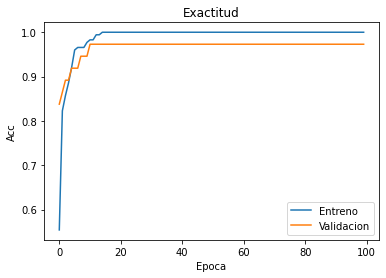

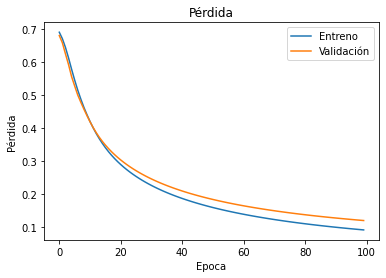

In [55]:
plt.figure(1)
plt.plot(history.history['accuracy'])  
plt.plot(history.history['val_accuracy'])  
plt.title('Exactitud')  
plt.ylabel('Acc')  
plt.xlabel('Epoca')  
plt.legend(['Entreno', 'Validacion'], loc='lower right')
plt.show()

plt.figure(1) 
plt.plot(history.history['loss'])  
plt.plot(history.history['val_loss'])  
plt.title('Pérdida')  
plt.ylabel('Pérdida')  
plt.xlabel('Epoca')  
plt.legend(['Entreno', 'Validación'], loc='upper right')  
plt.show()

In [56]:
# red convolucional
model_5 = load_model('Transfer_E1_Adam_partseed=1.h5')

model_5.summary()

Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_8 (Flatten)          (None, 2048)              0         
_________________________________________________________________
dense_25 (Dense)             (None, 5)                 10245     
_________________________________________________________________
dense_26 (Dense)             (None, 1)                 6         
Total params: 10,251
Trainable params: 10,251
Non-trainable params: 0
_________________________________________________________________


In [57]:
Y_pred = model_5.predict(feat_X)
Y_preds = (Y_pred > 0.5)

confusion_matrix(Y.T, Y_preds)

array([[145,   0],
       [  1, 104]], dtype=int64)

### Ejercicio 2.3
Construya un algoritmo que utilice el mejor modelo de red neuronal para la detección de poblaciones en la imagen completa IMG_3451.JPG, y estime la densidad para cada población detectada.

*Ayuda:* Mediante un procedimiento sencillo, primero detecte las poblaciones de frailejones y luego estime su densidad, calculada como el numero de frailejones por area poblada.

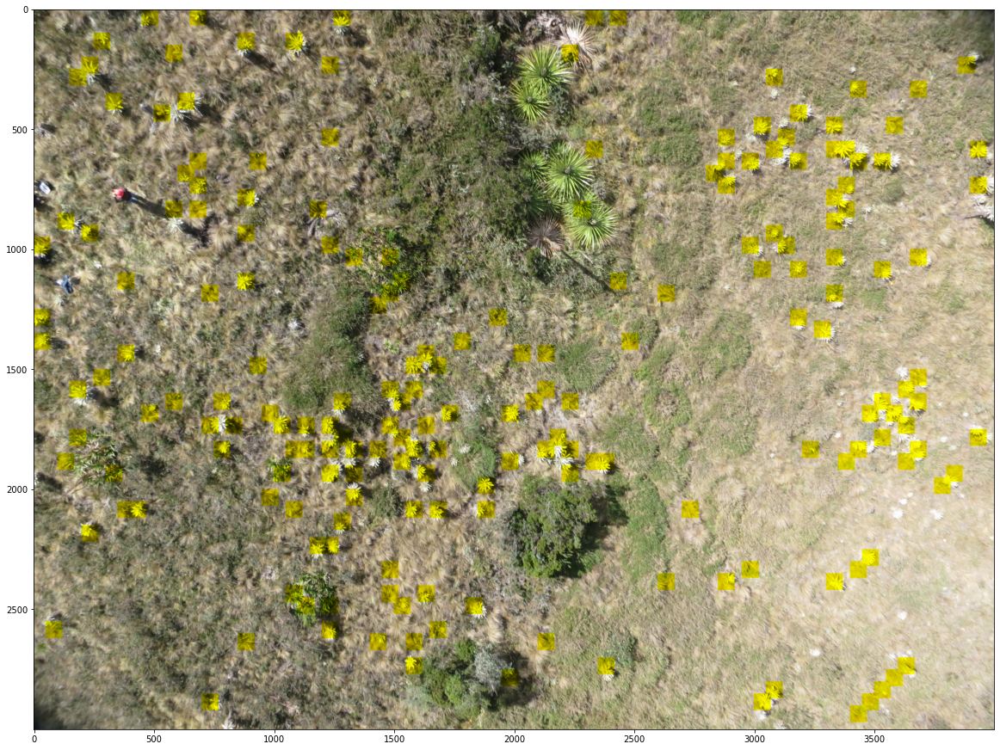

In [93]:
# Lo pasamos por nuestra imagen de prueba
x = np.array(img)
x2 = x

ni = x.shape[0]-50
mi = x.shape[1]-50

n_frailej_a=0
n_frailej_t=0
n_pedazos=1

f1=0
f2=70
for i in range(1,ni,50):
    c1=0
    c2=70
    for j in range(1,mi,50):
        subi=x[f1:f2,c1:c2,]/255.
        subi2=np.expand_dims(subi,0)
        feat_subi2 = model0.predict(subi2)
        Y_preds = model_5.predict(feat_subi2)
        pred_P = (Y_preds > 0.5)
        if(pred_P==1):
            x2[f1:f2,c1:c2,2]=0
            n_frailej_a=n_frailej_a+1
        c1=c1+50
        c2=c2+50
    f1=f1+50
    f2=f2+50
    n_pedazos=n_pedazos+1
        
plt.figure(figsize = (20,20))
plt.imshow(x2)

In [86]:
prop_frail_area=n_frailej_a/n_pedazos
prop_frail_area

3.3333333333333335

In [94]:
# Resultados:
print("El numero de Frailejones es: "+str(n_frailej_a))
print("El numero de áreas de la imagen es: "+str(n_pedazos))
print("la densidad de frailejones por área es: "+str(prop_frail_area))

El numero de Frailejones es: 200
El numero de áreas de la imagen es: 60
la densidad de frailejones por área es: 3.3333333333333335
